# Project: Wrangling and Analyze Data

In [ ]:
conda install -c conda-forge wordcloud

In [1]:
import pandas as pd
import numpy as np
import requests
import io
import json
import matplotlib.pyplot as plt
import seaborn as sns
import re
from bs4 import BeautifulSoup
from wordcloud import WordCloud, STOPWORDS
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

## Data Gathering

In [2]:
df = pd.read_csv('twitter-archive-enhanced.csv')

In [3]:
url = 'https://d17h27t6h515a5.cloudfront.net/topher/2017/August/599fd2ad_image-predictions/image-predictions.tsv'
r = requests.get(url)
df2 = pd.read_csv(io.StringIO(r.text), sep='\t')

In [4]:
df3 = pd.read_json('tweet-json.txt', lines=True)

## Assessing Data

In [5]:
df

,tweet_id,in_reply_to_status_id,in_reply_to_user_id,timestamp,source,text,retweeted_status_id,retweeted_status_user_id,retweeted_status_timestamp,expanded_urls,rating_numerator,rating_denominator,name,doggo,floofer,pupper,puppo
0,892420643555336193,NaN,NaN,2017-08-01 16:23:56 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Phineas. He's a mystical boy. Only eve...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/892420643...,13,10,Phineas,None,None,None,None
1,892177421306343426,NaN,NaN,2017-08-01 00:17:27 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Tilly. She's just checking pup on you....,NaN,NaN,NaN,https://twitter.com/dog_rates/status/892177421...,13,10,Tilly,None,None,None,None
2,891815181378084864,NaN,NaN,2017-07-31 00:18:03 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Archie. He is a rare Norwegian Pouncin...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/891815181...,12,10,Archie,None,None,None,None
3,891689557279858688,NaN,NaN,2017-07-30 15:58:51 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Darla. She commenced a snooze mid meal...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/891689557...,13,10,Darla,None,None,None,None
4,891327558926688256,NaN,NaN,2017-07-29 16:00:24 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Franklin. He would like you to stop ca...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/891327558...,12,10,Franklin,None,None,None,None
5,891087950875897856,NaN,NaN,2017-07-29 00:08:17 +0000,"<a href=""http://twitter.com/download/iphone"" r...",Here we have a majestic great white breaching ...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/891087950...,13,10,None,None,None,None,None
6,890971913173991426,NaN,NaN,2017-07-28 16:27:12 +0000,"<a href=""http://twitter.com/download/iphone"" r...",Meet Jax. He enjoys ice cream so much he gets ...,NaN,NaN,NaN,"https://gofundme.com/ydvmve-surgery-for-jax,ht...",13,10,Jax,None,None,None,None
7,890729181411237888,NaN,NaN,2017-07-28 00:22:40 +0000,"<a href=""http://twitter.com/download/iphone"" r...",When you watch your owner call another dog a g...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/890729181...,13,10,None,None,None,None,None
8,890609185150312448,NaN,NaN,2017-07-27 16:25:51 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Zoey. She doesn't want to be one of th...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/890609185...,13,10,Zoey,None,None,None,None
9,890240255349198849,NaN,NaN,2017-07-26 15:59:51 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Cassie. She is a college pup. Studying...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/890240255...,14,10,Cassie,doggo,None,None,None


In [6]:
print(df.shape)
df.info()

(2356, 17)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2356 entries, 0 to 2355
Data columns (total 17 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   tweet_id                    2356 non-null   int64  
 1   in_reply_to_status_id       78 non-null     float64
 2   in_reply_to_user_id         78 non-null     float64
 3   timestamp                   2356 non-null   object 
 4   source                      2356 non-null   object 
 5   text                        2356 non-null   object 
 6   retweeted_status_id         181 non-null    float64
 7   retweeted_status_user_id    181 non-null    float64
 8   retweeted_status_timestamp  181 non-null    object 
 9   expanded_urls               2297 non-null   object 
 10  rating_numerator            2356 non-null   int64  
 11  rating_denominator          2356 non-null   int64  
 12  name                        2356 non-null   object 
 13  doggo                 

In [7]:
df.duplicated().sum()

0

In [8]:
df.describe()

,tweet_id,in_reply_to_status_id,in_reply_to_user_id,retweeted_status_id,retweeted_status_user_id,rating_numerator,rating_denominator
count,2.356000e+03,7.800000e+01,7.800000e+01,1.810000e+02,1.810000e+02,2356.000000,2356.000000
mean,7.427716e+17,7.455079e+17,2.014171e+16,7.720400e+17,1.241698e+16,13.126486,10.455433
std,6.856705e+16,7.582492e+16,1.252797e+17,6.236928e+16,9.599254e+16,45.876648,6.745237
min,6.660209e+17,6.658147e+17,1.185634e+07,6.661041e+17,7.832140e+05,0.000000,0.000000
25%,6.783989e+17,6.757419e+17,3.086374e+08,7.186315e+17,4.196984e+09,10.000000,10.000000
50%,7.196279e+17,7.038708e+17,4.196984e+09,7.804657e+17,4.196984e+09,11.000000,10.000000
75%,7.993373e+17,8.257804e+17,4.196984e+09,8.203146e+17,4.196984e+09,12.000000,10.000000
max,8.924206e+17,8.862664e+17,8.405479e+17,8.874740e+17,7.874618e+17,1776.000000,170.000000


In [9]:
df.text[763]

"This is Sophie. She's a Jubilant Bush Pupper. Super h*ckin rare. Appears at random just to smile at the locals. 11.27/10 would smile back https://t.co/QFaUiIHxHq"

In [10]:
j = df.query('doggo != "None" or floofer != "None" or pupper != "None" or puppo != "None"')
len(j)

380

In [11]:
df2

,tweet_id,jpg_url,img_num,p1,p1_conf,p1_dog,p2,p2_conf,p2_dog,p3,p3_conf,p3_dog
0,666020888022790149,https://pbs.twimg.com/media/CT4udn0WwAA0aMy.jpg,1,Welsh_springer_spaniel,0.465074,True,collie,1.566650e-01,True,Shetland_sheepdog,6.142850e-02,True
1,666029285002620928,https://pbs.twimg.com/media/CT42GRgUYAA5iDo.jpg,1,redbone,0.506826,True,miniature_pinscher,7.419170e-02,True,Rhodesian_ridgeback,7.201000e-02,True
2,666033412701032449,https://pbs.twimg.com/media/CT4521TWwAEvMyu.jpg,1,German_shepherd,0.596461,True,malinois,1.385840e-01,True,bloodhound,1.161970e-01,True
3,666044226329800704,https://pbs.twimg.com/media/CT5Dr8HUEAA-lEu.jpg,1,Rhodesian_ridgeback,0.408143,True,redbone,3.606870e-01,True,miniature_pinscher,2.227520e-01,True
4,666049248165822465,https://pbs.twimg.com/media/CT5IQmsXIAAKY4A.jpg,1,miniature_pinscher,0.560311,True,Rottweiler,2.436820e-01,True,Doberman,1.546290e-01,True
5,666050758794694657,https://pbs.twimg.com/media/CT5Jof1WUAEuVxN.jpg,1,Bernese_mountain_dog,0.651137,True,English_springer,2.637880e-01,True,Greater_Swiss_Mountain_dog,1.619920e-02,True
6,666051853826850816,https://pbs.twimg.com/media/CT5KoJ1WoAAJash.jpg,1,box_turtle,0.933012,False,mud_turtle,4.588540e-02,False,terrapin,1.788530e-02,False
7,666055525042405380,https://pbs.twimg.com/media/CT5N9tpXIAAifs1.jpg,1,chow,0.692517,True,Tibetan_mastiff,5.827940e-02,True,fur_coat,5.444860e-02,False
8,666057090499244032,https://pbs.twimg.com/media/CT5PY90WoAAQGLo.jpg,1,shopping_cart,0.962465,False,shopping_basket,1.459380e-02,False,golden_retriever,7.958960e-03,True
9,666058600524156928,https://pbs.twimg.com/media/CT5Qw94XAAA_2dP.jpg,1,miniature_poodle,0.201493,True,komondor,1.923050e-01,True,soft-coated_wheaten_terrier,8.208610e-02,True


In [12]:
print(df2.shape)
df2.info()

(2075, 12)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2075 entries, 0 to 2074
Data columns (total 12 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   tweet_id  2075 non-null   int64  
 1   jpg_url   2075 non-null   object 
 2   img_num   2075 non-null   int64  
 3   p1        2075 non-null   object 
 4   p1_conf   2075 non-null   float64
 5   p1_dog    2075 non-null   bool   
 6   p2        2075 non-null   object 
 7   p2_conf   2075 non-null   float64
 8   p2_dog    2075 non-null   bool   
 9   p3        2075 non-null   object 
 10  p3_conf   2075 non-null   float64
 11  p3_dog    2075 non-null   bool   
dtypes: bool(3), float64(3), int64(2), object(4)
memory usage: 152.1+ KB


In [13]:
df2.duplicated().sum()

0

In [14]:
df3

,created_at,id,id_str,full_text,truncated,display_text_range,entities,extended_entities,source,in_reply_to_status_id,in_reply_to_status_id_str,in_reply_to_user_id,in_reply_to_user_id_str,in_reply_to_screen_name,user,geo,coordinates,place,contributors,is_quote_status,retweet_count,favorite_count,favorited,retweeted,possibly_sensitive,possibly_sensitive_appealable,lang,retweeted_status,quoted_status_id,quoted_status_id_str,quoted_status
0,2017-08-01 16:23:56+00:00,892420643555336193,892420643555336192,This is Phineas. He's a mystical boy. Only eve...,False,"[0, 85]","{'hashtags': [], 'symbols': [], 'user_mentions...","{'media': [{'id': 892420639486877696, 'id_str'...","<a href=""http://twitter.com/download/iphone"" r...",NaN,NaN,NaN,NaN,None,"{'id': 4196983835, 'id_str': '4196983835', 'na...",NaN,NaN,None,NaN,False,8853,39467,False,False,0.0,0.0,en,NaN,NaN,NaN,NaN
1,2017-08-01 00:17:27+00:00,892177421306343426,892177421306343424,This is Tilly. She's just checking pup on you....,False,"[0, 138]","{'hashtags': [], 'symbols': [], 'user_mentions...","{'media': [{'id': 892177413194625024, 'id_str'...","<a href=""http://twitter.com/download/iphone"" r...",NaN,NaN,NaN,NaN,None,"{'id': 4196983835, 'id_str': '4196983835', 'na...",NaN,NaN,None,NaN,False,6514,33819,False,False,0.0,0.0,en,NaN,NaN,NaN,NaN
2,2017-07-31 00:18:03+00:00,891815181378084864,891815181378084864,This is Archie. He is a rare Norwegian Pouncin...,False,"[0, 121]","{'hashtags': [], 'symbols': [], 'user_mentions...","{'media': [{'id': 891815175371796480, 'id_str'...","<a href=""http://twitter.com/download/iphone"" r...",NaN,NaN,NaN,NaN,None,"{'id': 4196983835, 'id_str': '4196983835', 'na...",NaN,NaN,None,NaN,False,4328,25461,False,False,0.0,0.0,en,NaN,NaN,NaN,NaN
3,2017-07-30 15:58:51+00:00,891689557279858688,891689557279858688,This is Darla. She commenced a snooze mid meal...,False,"[0, 79]","{'hashtags': [], 'symbols': [], 'user_mentions...","{'media': [{'id': 891689552724799489, 'id_str'...","<a href=""http://twitter.com/download/iphone"" r...",NaN,NaN,NaN,NaN,None,"{'id': 4196983835, 'id_str': '4196983835', 'na...",NaN,NaN,None,NaN,False,8964,42908,False,False,0.0,0.0,en,NaN,NaN,NaN,NaN
4,2017-07-29 16:00:24+00:00,891327558926688256,891327558926688256,This is Franklin. He would like you to stop ca...,False,"[0, 138]","{'hashtags': [{'text': 'BarkWeek', 'indices': ...","{'media': [{'id': 891327551943041024, 'id_str'...","<a href=""http://twitter.com/download/iphone"" r...",NaN,NaN,NaN,NaN,None,"{'id': 4196983835, 'id_str': '4196983835', 'na...",NaN,NaN,None,NaN,False,9774,41048,False,False,0.0,0.0,en,NaN,NaN,NaN,NaN
5,2017-07-29 00:08:17+00:00,891087950875897856,891087950875897856,Here we have a majestic great white breaching ...,False,"[0, 138]","{'hashtags': [{'text': 'BarkWeek', 'indices': ...","{'media': [{'id': 891087942176911360, 'id_str'...","<a href=""http://twitter.com/download/iphone"" r...",NaN,NaN,NaN,NaN,None,"{'id': 4196983835, 'id_str': '4196983835', 'na...",NaN,NaN,None,NaN,False,3261,20562,False,False,0.0,0.0,en,NaN,NaN,NaN,NaN
6,2017-07-28 16:27:12+00:00,890971913173991426,890971913173991424,Meet Jax. He enjoys ice cream so much he gets ...,False,"[0, 140]","{'hashtags': [], 'symbols': [], 'user_mentions...","{'media': [{'id': 890971906207338496, 'id_str'...","<a href=""http://twitter.com/download/iphone"" r...",NaN,NaN,NaN,NaN,None,"{'id': 4196983835, 'id_str': '4196983835', 'na...",NaN,NaN,None,NaN,False,2158,12041,False,False,0.0,0.0,en,NaN,NaN,NaN,NaN
7,2017-07-28 00:22:40+00:00,890729181411237888,890729181411237888,When you watch your owner call another dog a g...,False,"[0, 118]","{'hashtags': [], 'symbols': [], 'user_mentions...","{'media': [{'id': 890729118844600320, 'id_str'...","<a href=""http://twitter.com/download/iphone"" r...",NaN,NaN,NaN,NaN,None,"{'id': 4196983835, 'id_str': '4196983835', 'na...",NaN,NaN,None,NaN,False,16716,56848,False,False,0.0,0.0,en,NaN,NaN,NaN,NaN
8,2017-07-27 16:25:51+00:00,890609185150312448,890609185150312448,

In [15]:
print(df3.shape)
df3.info()

(2354, 31)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2354 entries, 0 to 2353
Data columns (total 31 columns):
 #   Column                         Non-Null Count  Dtype              
---  ------                         --------------  -----              
 0   created_at                     2354 non-null   datetime64[ns, UTC]
 1   id                             2354 non-null   int64              
 2   id_str                         2354 non-null   int64              
 3   full_text                      2354 non-null   object             
 4   truncated                      2354 non-null   bool               
 5   display_text_range             2354 non-null   object             
 6   entities                       2354 non-null   object             
 7   extended_entities              2073 non-null   object             
 8   source                         2354 non-null   object             
 9   in_reply_to_status_id          78 non-null     float64            
 10  in_reply_to_s

In [16]:
df3['truncated'].value_counts()

False    2354
Name: truncated, dtype: int64

In [17]:
df3['possibly_sensitive'].value_counts()

0.0    2211
Name: possibly_sensitive, dtype: int64

In [18]:
df3['possibly_sensitive_appealable'].value_counts()

0.0    2211
Name: possibly_sensitive_appealable, dtype: int64

In [19]:
de = pd.json_normalize(df3.user)
de['followers_count'].max() - de['followers_count'].min()
#pd.json_normalize(en.media[0])

219

In [20]:
en = pd.json_normalize(df3.entities)
en

,hashtags,symbols,user_mentions,urls,media
0,[],[],[],[],"[{'id': 892420639486877696, 'id_str': '8924206..."
1,[],[],[],[],"[{'id': 892177413194625024, 'id_str': '8921774..."
2,[],[],[],[],"[{'id': 891815175371796480, 'id_str': '8918151..."
3,[],[],[],[],"[{'id': 891689552724799489, 'id_str': '8916895..."
4,"[{'text': 'BarkWeek', 'indices': [129, 138]}]",[],[],[],"[{'id': 891327551943041024, 'id_str': '8913275..."
5,"[{'text': 'BarkWeek', 'indices': [129, 138]}]",[],[],[],"[{'id': 891087942176911360, 'id_str': '8910879..."
6,[],[],[],"[{'url': 'https://t.co/Zr4hWfAs1H', 'expanded_...","[{'id': 890971906207338496, 'id_str': '8909719..."
7,[],[],[],[],"[{'id': 890729118844600320, 'id_str': '8907291..."
8,"[{'text': 'BarkWeek', 'indices': [113, 122]}]",[],[],[],"[{'id': 890609177319665665, 'id_str': '8906091..."
9,[],[],[],[],"[{'id': 890240245463175168, 'id_str': '8902402..."


In [21]:
pd.json_normalize(en.media[23])

,id,id_str,indices,media_url,media_url_https,url,display_url,expanded_url,type,sizes.thumb.w,sizes.thumb.h,sizes.thumb.resize,sizes.medium.w,sizes.medium.h,sizes.medium.resize,sizes.small.w,sizes.small.h,sizes.small.resize,sizes.large.w,sizes.large.h,sizes.large.resize
0,887343120832229379,887343120832229379,"[89, 112]",http://pbs.twimg.com/ext_tw_video_thumb/887343...,https://pbs.twimg.com/ext_tw_video_thumb/88734...,https://t.co/WZqNqygEyV,pic.twitter.com/WZqNqygEyV,https://twitter.com/dog_rates/status/887343217...,photo,150,150,crop,600,338,fit,340,191,fit,1024,576,fit


In [22]:
ex_en = pd.json_normalize(df3.extended_entities[0])
ex_en

,media
0,"[{'id': 892420639486877696, 'id_str': '8924206..."


In [23]:
pd.json_normalize(ex_en.media[0])

,id,id_str,indices,media_url,media_url_https,url,display_url,expanded_url,type,sizes.large.w,sizes.large.h,sizes.large.resize,sizes.thumb.w,sizes.thumb.h,sizes.thumb.resize,sizes.small.w,sizes.small.h,sizes.small.resize,sizes.medium.w,sizes.medium.h,sizes.medium.resize
0,892420639486877696,892420639486877696,"[86, 109]",http://pbs.twimg.com/media/DGKD1-bXoAAIAUK.jpg,https://pbs.twimg.com/media/DGKD1-bXoAAIAUK.jpg,https://t.co/MgUWQ76dJU,pic.twitter.com/MgUWQ76dJU,https://twitter.com/dog_rates/status/892420643...,photo,540,528,fit,150,150,crop,540,528,fit,540,528,fit


### Quality issues
#### df
1. Retweeted rows should not be included.
2. 'in_reply_to_status_id', 'in_reply_to_user_id', 'retweeted_status_id', 'retweeted_status_user_id', 'retweeted_status_timestamp' columns has too many missing values
3. Source column is not relevant
4. missing values in 'doggo', 'floofer', 'pupper', 'puppo' represented as 'none'
5. ratings_numerator column values is not all correct 
#### df2
6. Some dog breeds are not actual breed names
#### df3
7. 'text' column duplicated in df3 as 'full_text'
8. entities and extended_entities columns are not relevant
9. No values in 'geo' and 'coordinates'and 'contributors' columns
10. 'quoted_status', 'quoted_status_id_str', 'quoted_status_id', 'quoted_status', 'place' have too many missing values
11. 'created_at','in_reply_to_status_id', 'in_reply_to_user_id' repeated in df3
12. 'in_reply_to_status_id_str' and 'in_reply_to_user_id_str' contain same values as 'in_reply_to_status_id', 'in_reply_to_user_id' just datatype is string
13. 'truncated', 'possibly_sensitive', 'possibly_sensitive_appealable' contain only one value.
14. entities', 'extended_entities' and 'user' columns contain repeated information like id, id_string, etc 

### Tidiness issues
- One observational unit spans multiple tables.
#### df
1. Time and date in the same column.
2. rating_numerator and rating_denominator should be one column rating
3. text and tweet link are in the same column
4. Dog stages 'doggo', 'floofer', 'pupper', 'puppo' should be in a single column
#### df2
3. p1, p2, p3, should be one column breed
#### df3
4. 'entities', 'extended_entities', 'users' columns contain nested values

## Cleaning Data
In this section, clean **all** of the issues you documented while assessing. 

**Note:** Make a copy of the original data before cleaning. Cleaning includes merging individual pieces of data according to the rules of [tidy data](https://cran.r-project.org/web/packages/tidyr/vignettes/tidy-data.html). The result should be a high-quality and tidy master pandas DataFrame (or DataFrames, if appropriate).

In [24]:
# Make copies of original pieces of data
df_clean = df.copy()
df2_clean = df2.copy()
df3_clean = df3.copy()

## df - Quality issues 

### Issue #1
#### Define: drop retweeted rows
##### Code

In [25]:
df_clean = df_clean[df_clean['retweeted_status_id'].isnull()]

##### test

In [26]:
df_clean.shape[0] == df_clean['retweeted_status_id'].isnull().sum()

True

### Issue #2
#### Define: drop 'in_reply_to_status_id', 'in_reply_to_user_id', 'retweeted_status_id', 'retweeted_status_user_id', 'retweeted_status_timestamp' columns
##### Code

##### function to delete columns with too many missing values

In [27]:
def drop_col(df):
    for col in df.columns:
        #percentage of missing values
        nan_per = (df[col].isnull().sum() / len(df)) * 100
        #drop columns with missing values more than 80%
        if nan_per > 80:
            df.drop(columns=col, inplace = True)
    
    return df
    

In [28]:
#df_clean.drop(columns=['in_reply_to_status_id', 'in_reply_to_user_id', 'retweeted_status_id', 'retweeted_status_user_id', 'retweeted_status_timestamp'], inplace=True)
df_clean = drop_col(df_clean)

#### Test

In [29]:
df_clean.head(1)

,tweet_id,timestamp,source,text,expanded_urls,rating_numerator,rating_denominator,name,doggo,floofer,pupper,puppo
0,892420643555336193,2017-08-01 16:23:56 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Phineas. He's a mystical boy. Only eve...,https://twitter.com/dog_rates/status/892420643...,13,10,Phineas,None,None,None,None


### Issue #3

#### Define: Dropping columns not relevant to the analysis
##### Code

In [30]:
df_clean.drop(columns=['source', 'expanded_urls'], inplace=True)

#### Test

In [31]:
df_clean.head(1)

,tweet_id,timestamp,text,rating_numerator,rating_denominator,name,doggo,floofer,pupper,puppo
0,892420643555336193,2017-08-01 16:23:56 +0000,This is Phineas. He's a mystical boy. Only eve...,13,10,Phineas,None,None,None,None


## Tidiness issues
### Issue #1: 
#### Define: split timestamp into date and time columns

#### Code

In [32]:
#I'm using the insert function to append date at index 1 in the dataframe
dates = []
for time in df_clean.timestamp:
    date, time = time.split(' ')[:2]
    dates.append(date)

df_clean.insert(1, 'date', dates)
df_clean.drop(columns='timestamp', inplace=True)

#### Test

In [33]:
df_clean.head(1)

,tweet_id,date,text,rating_numerator,rating_denominator,name,doggo,floofer,pupper,puppo
0,892420643555336193,2017-08-01,This is Phineas. He's a mystical boy. Only eve...,13,10,Phineas,None,None,None,None


### Issue #2
#### Define: Remove link at the end of text in text column
##### code

In [34]:
#run column only once
texts = []
for text in df_clean.text:
    texts.append(text[:-24])
df_clean['text'] = texts

#### test

In [35]:
df_clean['text'][0]

"This is Phineas. He's a mystical boy. Only ever appears in the hole of a donut. 13/10"

### Issue #3
#### Define: Drop columns with denominators greater than 10 and numerators greeater than 15
##### Code

In [36]:
# I decided to change this values after visually confirming from the dataset
# df_clean.loc[784, 'rating_numerator'] = 14
df_clean.loc[1068, 'rating_numerator'] = 14
df_clean.loc[1068, 'rating_denominator'] = 10
df_clean.loc[1165, 'rating_numerator'] = 13
df_clean.loc[1165, 'rating_denominator'] = 10
df_clean.loc[1662, 'rating_numerator'] = 10
df_clean.loc[1662, 'rating_denominator'] = 10

In [37]:
df_clean = df_clean.query('rating_denominator == 10 and rating_numerator <= 17')
df_clean.head()

,tweet_id,date,text,rating_numerator,rating_denominator,name,doggo,floofer,pupper,puppo
0,892420643555336193,2017-08-01,This is Phineas. He's a mystical boy. Only eve...,13,10,Phineas,None,None,None,None
1,892177421306343426,2017-08-01,This is Tilly. She's just checking pup on you....,13,10,Tilly,None,None,None,None
2,891815181378084864,2017-07-31,This is Archie. He is a rare Norwegian Pouncin...,12,10,Archie,None,None,None,None
3,891689557279858688,2017-07-30,This is Darla. She commenced a snooze mid meal...,13,10,Darla,None,None,None,None
4,891327558926688256,2017-07-29,This is Franklin. He would like you to stop ca...,12,10,Franklin,None,None,None,None


##### test

In [38]:
df_clean[['rating_numerator', 'rating_denominator']].value_counts()

rating_numerator  rating_denominator
12                10                    500
10                10                    443
11                10                    425
13                10                    308
9                 10                    155
8                 10                     98
7                 10                     53
14                10                     44
5                 10                     36
6                 10                     32
3                 10                     19
4                 10                     15
2                 10                      9
1                 10                      7
0                 10                      2
15                10                      1
17                10                      1
dtype: int64

### Issue #4
#### Define: Create new column rating by dividing rating_numerator by rating_denominator
##### code

In [39]:
df_clean['rating'] = df_clean['rating_numerator'] / df_clean['rating_denominator']
df_clean.drop(columns=['rating_numerator', 'rating_denominator'], inplace=True)

##### test

In [40]:
df_clean.head()

,tweet_id,date,text,name,doggo,floofer,pupper,puppo,rating
0,892420643555336193,2017-08-01,This is Phineas. He's a mystical boy. Only eve...,Phineas,None,None,None,None,1.3
1,892177421306343426,2017-08-01,This is Tilly. She's just checking pup on you....,Tilly,None,None,None,None,1.3
2,891815181378084864,2017-07-31,This is Archie. He is a rare Norwegian Pouncin...,Archie,None,None,None,None,1.2
3,891689557279858688,2017-07-30,This is Darla. She commenced a snooze mid meal...,Darla,None,None,None,None,1.3
4,891327558926688256,2017-07-29,This is Franklin. He would like you to stop ca...,Franklin,None,None,None,None,1.2


### Issue #5
#### Define: merge dog stages column into one column 'dog_stages'
##### code

In [41]:
df_clean['doggo'].replace('None', '', inplace=True)
df_clean['floofer'].replace('None', '', inplace=True)
df_clean['pupper'].replace('None', '', inplace=True)
df_clean['puppo'].replace('None', '', inplace=True)

df_clean['dog_stages'] = df_clean['doggo'] + df_clean['floofer'] + df_clean['pupper'] + df_clean['puppo']

df_clean.loc[df_clean['dog_stages'] == 'doggopupper', 'dog_stages'] = 'doggo,pupper' 
df_clean.loc[df_clean['dog_stages'] == 'doggopuppo', 'dog_stages'] = 'doggo,puppo' 
df_clean.loc[df_clean['dog_stages'] == 'doggofloofer', 'dog_stages'] = 'doggo,floofer'

df_clean.drop(columns=['doggo', 'floofer', 'pupper', 'puppo'], inplace=True)

In [42]:
df_clean.head()

,tweet_id,date,text,name,rating,dog_stages
0,892420643555336193,2017-08-01,This is Phineas. He's a mystical boy. Only eve...,Phineas,1.3,
1,892177421306343426,2017-08-01,This is Tilly. She's just checking pup on you....,Tilly,1.3,
2,891815181378084864,2017-07-31,This is Archie. He is a rare Norwegian Pouncin...,Archie,1.2,
3,891689557279858688,2017-07-30,This is Darla. She commenced a snooze mid meal...,Darla,1.3,
4,891327558926688256,2017-07-29,This is Franklin. He would like you to stop ca...,Franklin,1.2,


## df2 - Quality issues 

### Issue #4

#### Define: Create a column breeds that contains actual breed names

#### Code

###### Importing fci-breeds table to confirm dog breed names

In [43]:
dog_breeds = pd.read_csv('fci-breeds.csv')
dog_breeds.head()

,id,name,group,section,provisional,country,url,image,pdf
0,1,ENGLISH POINTER,Pointing Dogs,British and Irish Pointers and Setters,NaN,GREAT BRITAIN,http://www.fci.be/en/nomenclature/ENGLISH-POIN...,http://www.fci.be/Nomenclature/Illustrations/0...,http://www.fci.be/Nomenclature/Standards/001g0...
1,2,ENGLISH SETTER,Pointing Dogs,British and Irish Pointers and Setters,NaN,GREAT BRITAIN,http://www.fci.be/en/nomenclature/ENGLISH-SETT...,http://www.fci.be/Nomenclature/Illustrations/0...,http://www.fci.be/Nomenclature/Standards/002g0...
2,3,KERRY BLUE TERRIER,Terriers,Large and medium sized Terriers,NaN,IRELAND,http://www.fci.be/en/nomenclature/KERRY-BLUE-T...,NaN,http://www.fci.be/Nomenclature/Standards/003g0...
3,4,CAIRN TERRIER,Terriers,Small sized Terriers,NaN,GREAT BRITAIN,http://www.fci.be/en/nomenclature/CAIRN-TERRIE...,http://www.fci.be/Nomenclature/Illustrations/0...,http://www.fci.be/Nomenclature/Standards/004g0...
4,5,ENGLISH COCKER SPANIEL,Retrievers,Flushing Dogs,NaN,GREAT BRITAIN,http://www.fci.be/en/nomenclature/ENGLISH-COCK...,http://www.fci.be/Nomenclature/Illustrations/0...,http://www.fci.be/Nomenclature/Standards/005g0...


##### Getting another list of dog breeds from the web using web scrabing

In [44]:
url = 'https://dogtime.com/dog-breeds/profiles'
response = requests.get(url)
soup = BeautifulSoup(response.content, 'lxml')
soup

<!DOCTYPE html>
<!--[if IE 8]> <html class="no-js lt-ie9"> <![endif]--><!--[if gt IE 8]><!--><html class="no-js"> <!--<![endif]--><head><meta charset="utf-8"/><meta content="IE=edge,chrome=1" http-equiv="X-UA-Compatible"/><meta content="bc06c90d1acb18ed0abe8e9b9c02db20" name="p:domain_verify"/><meta content="width=device-width, initial-scale=1, maximum-scale=1, minimal-ui" name="viewport"/><title>All Dog Breeds - Complete List of Dog Profiles</title><script>PB = window.PB || {};PB.hashlessUrl = "//dogtime.com/dog-breeds/profiles";
</script><script>(function(w,d,t,u){var a=d.createElement(t);a.async=1;a.src=u+"?url="+encodeURIComponent(w.location.href)+"&ref="+encodeURIComponent(d.referrer);var s=d.getElementsByTagName(t)[0];s.parentNode.insertBefore(a,s);})
(window, document, 'script', 'https://a.ad.gt/api/v1/u/matches/316')
</script><script>window.grumi = {key: '2a236ed9-fb8c-429e-ab47-cacac34a3be6'
};</script> <script async="" src="//rumcdn.geoedge.be/2a236ed9-fb8c-429e-ab47-cacac34a

Writing soup to html file so I can view easily in vscode

In [ ]:
with open('dogs.html', 'w', encoding='utf-8') as file:
    file.write(str(soup))

In [45]:
dog_b = []
dog_list = soup.find_all("a", class_="list-item-title" )
for d in dog_list:
    dog_b.append(d.contents[0])
dogs = pd.DataFrame(dog_b, columns=['name'])
dogs    

,name
0,Afador
1,Affenhuahua
2,Affenpinscher
3,Afghan Hound
4,Airedale Terrier
5,Akbash
6,Akita
7,Akita Chow
8,Akita Pit
9,Akita Shepherd


In [46]:
#maltese dog is represented as maltese in the dog breeds datasets
df2_clean.p1.replace('Maltese_dog', 'maltese', inplace=True)
#All kinds of poodles are represented as 'poodle' in both breeds datasets
poodles = ['miniature poodle', 'toy poodle', 'standard poodle']

#code to create breeds column 
breeds = []
not_breeds = []
for i in range(len(df2_clean)):
    breed = df2_clean['p1'][i].replace('_', ' ')
    breed2 = df2_clean['p2'][i].replace('_', ' ')
    breed3 = df2_clean['p3'][i].replace('_', ' ')
    
    if breed in poodles or(dog_breeds.name.str.contains(breed.upper()).sum() > 0) or (dogs.name.str.contains(breed.title()).sum() > 0):
        breeds.append(breed)
    elif (dog_breeds.name.str.contains(breed2.upper()).sum() > 0) or (dogs.name.str.contains(breed2.title()).sum() > 0):
        breeds.append(breed2)
    elif (dog_breeds.name.str.contains(breed3.upper()).sum() > 0) or (dogs.name.str.contains(breed3.title()).sum() > 0):
        breeds.append(breed3)
    else:
        breeds.append('NaN')
        not_breeds.append(breed)
df2_clean['breeds'] = breeds

#### cock, otter, ox, gar, orange, harp, leopard, lion are not dog breeds. Replace then with dog breeds or NaN

In [47]:
not_dogs = ['cock', 'otter', 'ox', 'gar', 'orange', 'harp', 'leopard', 'lion']
breeds = dogs.name.to_list()
breeds2 = dog_breeds.name.to_list()
for i in range(len(df2_clean)):
    if df2_clean.breeds[i] in not_dogs:
        if (df2_clean.p2[i].title() in breeds) or (df2_clean.p2[i].upper() in breeds2):
            df2_clean.breeds.replace(df2_clean.breeds[i], df2_clean.p2[i], inplace=True)
        elif (df2_clean.p3[i].title() in breeds) or (df2_clean.p3[i].upper() in breeds2):
            df2_clean.breeds.replace(df2_clean.breeds[i], df2_clean.p3[i], inplace=True)
        else:
            df2_clean.breeds.replace(df2_clean.breeds[i], 'NaN', inplace=True)

## Tidiness issue
### issue #6
#### Define: Drop 'p1', 'p1_conf', 'p1_dog', 'p2', 'p2_conf', 'p2_dog','p3', 'p3_conf', and 'p3_dog' columns
##### code

In [48]:
df2_clean.drop(columns=['p1', 'p1_conf', 'p1_dog', 'p2', 'p2_conf', 'p2_dog','p3', 'p3_conf', 'p3_dog'], inplace=True)

##### test

In [49]:
df2_clean.head()

,tweet_id,jpg_url,img_num,breeds
0,666020888022790149,https://pbs.twimg.com/media/CT4udn0WwAA0aMy.jpg,1,Welsh springer spaniel
1,666029285002620928,https://pbs.twimg.com/media/CT42GRgUYAA5iDo.jpg,1,redbone
2,666033412701032449,https://pbs.twimg.com/media/CT4521TWwAEvMyu.jpg,1,German shepherd
3,666044226329800704,https://pbs.twimg.com/media/CT5Dr8HUEAA-lEu.jpg,1,Rhodesian ridgeback
4,666049248165822465,https://pbs.twimg.com/media/CT5IQmsXIAAKY4A.jpg,1,miniature pinscher


##### test

In [50]:
df2_clean.breeds.isin(not_dogs).sum()

0

#### test

In [51]:
np.unique(not_breeds)

array(['African crocodile', 'African grey', 'American black bear',
       'Angora', 'Arabian camel', 'Arctic fox', 'Blenheim spaniel',
       'Christmas stocking', 'Loafer', 'Madagascar cat', 'Pekinese',
       'Shih-Tzu', 'acorn squash', 'agama', 'axolotl', 'bakery',
       'bald eagle', 'balloon', 'bannister', 'barbell', 'barrow',
       'bath towel', 'bathtub', 'beach wagon', 'bearskin', 'beaver',
       'bee eater', 'bib', 'bighorn', 'binoculars', 'birdhouse', 'bison',
       'black-footed ferret', 'boathouse', 'bookcase', 'bow', 'bow tie',
       'box turtle', 'brown bear', 'bubble', 'bustard', 'candle',
       'car mirror', 'cheeseburger', 'cheetah', 'chimpanzee',
       'china cabinet', 'clog', 'coffee mug', 'coil', 'comic book',
       'common iguana', 'convertible', 'coral reef', 'cowboy hat',
       'crane', 'crash helmet', 'cuirass', 'cup', 'damselfly',
       'desktop computer', 'dhole', 'dining table', 'doormat', 'dough',
       'earthstar', 'electric fan', 'envelope', 'es

## df3 - Quality issues
### Issue #5
#### Define: Drop columns with too many missing values
##### code

In [52]:
df3_clean = drop_col(df3_clean)
df3_clean.head(1)

,created_at,id,id_str,full_text,truncated,display_text_range,entities,extended_entities,source,user,is_quote_status,retweet_count,favorite_count,favorited,retweeted,possibly_sensitive,possibly_sensitive_appealable,lang
0,2017-08-01 16:23:56+00:00,892420643555336193,892420643555336192,This is Phineas. He's a mystical boy. Only eve...,False,"[0, 85]","{'hashtags': [], 'symbols': [], 'user_mentions...","{'media': [{'id': 892420639486877696, 'id_str'...","<a href=""http://twitter.com/download/iphone"" r...","{'id': 4196983835, 'id_str': '4196983835', 'na...",False,8853,39467,False,False,0.0,0.0,en


### Issue #6
#### Define: Drop df columns repeated in df3 and columns repeated as strings
##### code

In [53]:
df3_clean.drop(columns=['created_at', 'id_str', 'source', 'full_text'], inplace=True)

### Issue #7
#### Define: Drop columns not relevant to the analysis
##### Code

In [54]:
df3_clean.drop(columns=['truncated','is_quote_status', 'possibly_sensitive', 'favorited', 'retweeted', 'possibly_sensitive_appealable', 'lang', 'display_text_range'], inplace=True)

##### Test

In [55]:
df3_clean.head(1)

,id,entities,extended_entities,user,retweet_count,favorite_count
0,892420643555336193,"{'hashtags': [], 'symbols': [], 'user_mentions...","{'media': [{'id': 892420639486877696, 'id_str'...","{'id': 4196983835, 'id_str': '4196983835', 'na...",8853,39467


### Issue #8
#### Define: Drop 'entities', 'extended_entities' and 'user' columns

In [56]:
df3_clean.drop(columns=['entities', 'extended_entities', 'user'], inplace=True)
df3_clean

,id,retweet_count,favorite_count
0,892420643555336193,8853,39467
1,892177421306343426,6514,33819
2,891815181378084864,4328,25461
3,891689557279858688,8964,42908
4,891327558926688256,9774,41048
5,891087950875897856,3261,20562
6,890971913173991426,2158,12041
7,890729181411237888,16716,56848
8,890609185150312448,4429,28226
9,890240255349198849,7711,32467


## Merging Datasets

In [57]:
dff = df_clean.merge(df3_clean, left_on='tweet_id', right_on ='id', how='left')
dff.drop(columns='id', inplace=True)
dff.shape

(2148, 8)

In [58]:
master_df = dff.merge(df2_clean, on='tweet_id', how='inner')
master_df.shape

(1974, 11)

In [87]:
master_df

,tweet_id,date,text,name,rating,dog_stages,retweet_count,favorite_count,jpg_url,img_num,breeds
0,892420643555336193,2017-08-01,This is Phineas. He's a mystical boy. Only eve...,Phineas,1.3,,8853,39467,https://pbs.twimg.com/media/DGKD1-bXoAAIAUK.jpg,1,NaN
1,892177421306343426,2017-08-01,This is Tilly. She's just checking pup on you....,Tilly,1.3,,6514,33819,https://pbs.twimg.com/media/DGGmoV4XsAAUL6n.jpg,1,Chihuahua
2,891815181378084864,2017-07-31,This is Archie. He is a rare Norwegian Pouncin...,Archie,1.2,,4328,25461,https://pbs.twimg.com/media/DGBdLU1WsAANxJ9.jpg,1,Chihuahua
3,891689557279858688,2017-07-30,This is Darla. She commenced a snooze mid meal...,Darla,1.3,,8964,42908,https://pbs.twimg.com/media/DF_q7IAWsAEuuN8.jpg,1,Labrador retriever
4,891327558926688256,2017-07-29,This is Franklin. He would like you to stop ca...,Franklin,1.2,,9774,41048,https://pbs.twimg.com/media/DF6hr6BUMAAzZgT.jpg,2,basset
5,891087950875897856,2017-07-29,Here we have a majestic great white breaching ...,None,1.3,,3261,20562,https://pbs.twimg.com/media/DF3HwyEWsAABqE6.jpg,1,Chesapeake Bay retriever
6,890971913173991426,2017-07-28,Meet Jax. He enjoys ice cream so much he gets ...,Jax,1.3,,2158,12041,https://pbs.twimg.com/media/DF1eOmZXUAALUcq.jpg,1,Appenzeller
7,890729181411237888,2017-07-28,When you watch your owner call another dog a g...,None,1.3,,16716,56848,https://pbs.twimg.com/media/DFyBahAVwAAhUTd.jpg,2,Pomeranian
8,890609185150312448,2017-07-27,This is Zoey. She doesn't want to be one of th...,Zoey,1.3,,4429,28226,https://pbs.twimg.com/media/DFwUU__XcAEpyXI.jpg,1,Irish terrier
9,890240255349198849,2017-07-26,This is Cassie. She is a college pup. Studying...,Cassie,1.4,doggo,7711,32467,https://pbs.twimg.com/media/DFrEyVuW0AAO3t9.jpg,1,Pembroke


## Storing Data
Save gathered, assessed, and cleaned master dataset to a CSV file named "twitter_archive_master.csv".

In [88]:
master_df.to_csv('twitter_archive_master.csv')

## Analyzing and Visualizing Data

### Questions
- What are the breeds with the most ratings?
- What are most favorited breeds?
- What year did the twitter account have the most engagements?
- Does the number of images uploaded influence the the favourite count?
- Which dog stage had the most engagements?

### Question 1

In [59]:
breeds_df = master_df[master_df['breeds'] != 'NaN']

In [60]:
top_rated_breeds = breeds_df.groupby('breeds')['rating'].mean().sort_values(ascending = False).iloc[:6]
top_rated_breeds

breeds
valley                  1.300000
Bouvier des Flandres    1.300000
Saluki                  1.250000
briard                  1.233333
Tibetan mastiff         1.225000
Border terrier          1.214286
Name: rating, dtype: float64

In [61]:
most_rated = master_df.query('breeds == "Bouvier des Flandres" or breeds == "valley" or breeds == "Saluki"')
most_rated

,tweet_id,date,text,name,rating,dog_stages,retweet_count,favorite_count,jpg_url,img_num,breeds
48,881666595344535552,2017-07-03,This is Gary. He couldn't miss this puppertuni...,Gary,1.3,,11099,51522,https://pbs.twimg.com/media/DDxPFwbWAAEbVVR.jpg,1,Saluki
67,877316821321428993,2017-06-21,Meet Dante. At first he wasn't a fan of his ne...,Dante,1.3,,5414,27907,https://pbs.twimg.com/media/DCza_vtXkAQXGpC.jpg,1,Saluki
126,861288531465048066,2017-05-07,HI. MY. NAME. IS. BOOMER. AND. I. WANT. TO. SA...,None,1.3,,4479,18032,https://pbs.twimg.com/ext_tw_video_thumb/86128...,1,Bouvier des Flandres
344,817120970343411712,2017-01-05,Name a more iconic quartet... I'll wait. 13/10...,None,1.3,,3011,13367,https://pbs.twimg.com/media/C1b_LSYUsAAJ494.jpg,1,Saluki
716,750056684286914561,2016-07-04,This is Jameson. He had a few too many in the ...,Jameson,1.1,,1011,3444,https://pbs.twimg.com/media/Cmfx2oNW8AAGg4H.jpg,1,Saluki
817,737310737551491075,2016-05-30,Everybody stop what you're doing and watch the...,None,1.3,,8329,16040,https://pbs.twimg.com/ext_tw_video_thumb/73731...,1,valley


### Question 2

In [62]:
top_breeds = breeds_df.groupby('breeds')['favorite_count'].mean().sort_values(ascending = False).iloc[:6]
top_breeds

breeds
Saluki                   24060.000000
dock                     19154.000000
Bedlington terrier       18641.285714
Bouvier des Flandres     18032.000000
flat-coated retriever    16791.625000
Weimaraner               16430.600000
Name: favorite_count, dtype: float64

In [63]:
most_fav = master_df.query('breeds == "Saluki" or breeds == "dock"')
most_fav

,tweet_id,date,text,name,rating,dog_stages,retweet_count,favorite_count,jpg_url,img_num,breeds
48,881666595344535552,2017-07-03,This is Gary. He couldn't miss this puppertuni...,Gary,1.3,,11099,51522,https://pbs.twimg.com/media/DDxPFwbWAAEbVVR.jpg,1,Saluki
67,877316821321428993,2017-06-21,Meet Dante. At first he wasn't a fan of his ne...,Dante,1.3,,5414,27907,https://pbs.twimg.com/media/DCza_vtXkAQXGpC.jpg,1,Saluki
130,860276583193509888,2017-05-04,This is Jordy. He likes to go on adventures an...,Jordy,1.2,,3745,19154,https://pbs.twimg.com/media/C_BQ_NlVwAAgYGD.jpg,1,dock
344,817120970343411712,2017-01-05,Name a more iconic quartet... I'll wait. 13/10...,None,1.3,,3011,13367,https://pbs.twimg.com/media/C1b_LSYUsAAJ494.jpg,1,Saluki
716,750056684286914561,2016-07-04,This is Jameson. He had a few too many in the ...,Jameson,1.1,,1011,3444,https://pbs.twimg.com/media/Cmfx2oNW8AAGg4H.jpg,1,Saluki


### Question 3

In [64]:
master_df['date'] = pd.to_datetime(master_df['date'])
master_df['year'] = pd.DatetimeIndex(master_df['date']).year

In [65]:
date_plot = master_df.groupby('year')[['favorite_count', 'retweet_count']].mean()
date_plot

,favorite_count,retweet_count
year,,
2015,2493.522796,1079.563830
2016,7756.887500,2746.170833
2017,24013.969101,5996.750000


### Question 4

In [66]:
master_df['img_num'].corr(master_df['favorite_count'])

0.13650614858993257

### Question 5

In [67]:
stages = master_df.groupby('dog_stages')[['favorite_count', 'retweet_count']].mean()[1:].sort_values(by='favorite_count',ascending=False)
stages

,favorite_count,retweet_count
dog_stages,,
"doggo,puppo",47844.000000,19196.000000
puppo,21582.090909,6473.954545
doggo,19356.380952,7125.698413
"doggo,floofer",17169.000000,3433.000000
floofer,13206.000000,4968.714286
"doggo,pupper",12533.111111,4083.444444
pupper,7197.133663,2365.950495


### Insights:
1. The most rated dog breed is Bouvier des Flandres and valley followed by Saluki, briard and Tibetan mastiff 
2. The most liked dog breed is saluki, followed by dock, Bedlington terrier, Bouvier des Flandres and flat-coated retriever
3. The twitter page had the most engagements in 2017
4. The favorite count has a positive correlation with image number. But this correlation is low and one can imply that the number of images uploaded does not significantly affect the favorite count. 
5. The doggo, puppo stage had the most number of engagements

### Visualizations

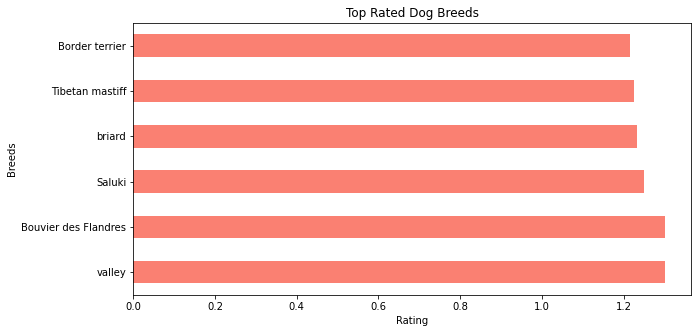

In [68]:
plt.subplots(figsize=(10, 5))
top_rated_breeds.plot(kind='barh', color='salmon')
plt.title('Top Rated Dog Breeds')
plt.xlabel('Rating')
plt.ylabel('Breeds');

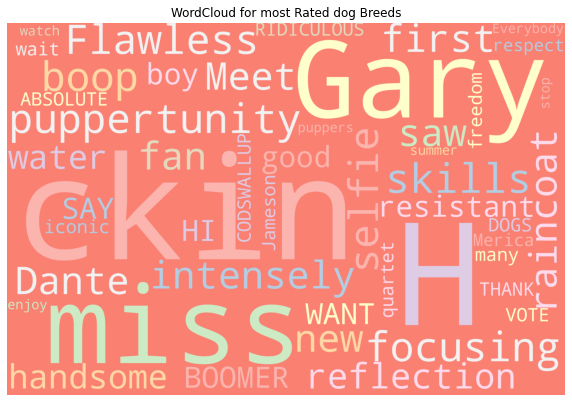

In [69]:
text = " ".join(dog for dog in most_rated.text)
stopwords = set(STOPWORDS)
stopwords.add("name")

word_cloud = WordCloud(
        width=3000,
        height=2000,
        random_state=1,
        background_color="salmon",
        colormap="Pastel1",
        collocations=False,
        stopwords=stopwords,
        ).generate(text)

#generate wordcloud
plt.subplots(figsize=(10, 15))
plt.imshow(word_cloud)
plt.axis("off")
plt.title('WordCloud for most Rated dog Breeds');

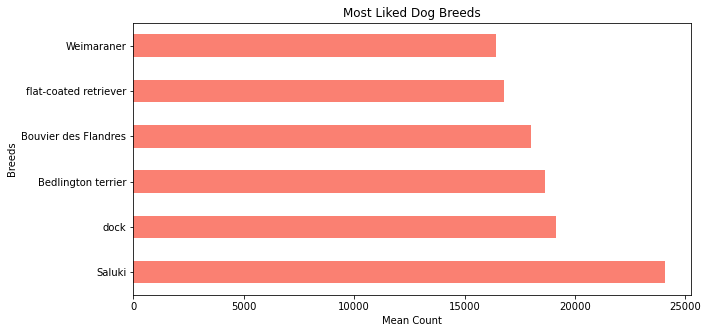

In [70]:
plt.subplots(figsize=(10, 5))
top_breeds.plot(kind='barh', color='salmon')
plt.xlabel('Mean Count')
plt.ylabel('Breeds')
plt.title('Most Liked Dog Breeds');

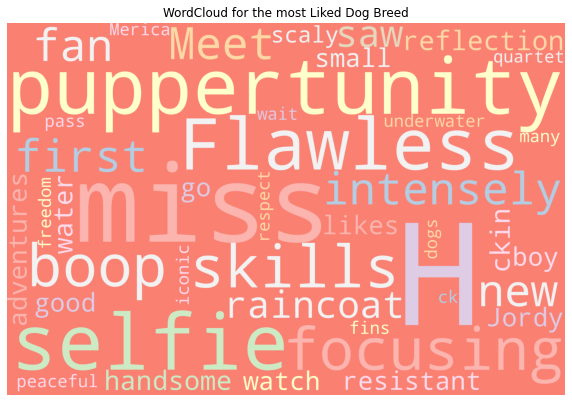

In [71]:
text = " ".join(dog for dog in most_fav.text)
stopwords = set(STOPWORDS)
stopwords.add("name")
stopwords.add("Gary")
stopwords.add("Dante")
stopwords.add("Jameson")
stopwords.add("Jerry")
word_cloud = WordCloud(
        width=3000,
        height=2000,
        random_state=1,
        background_color="salmon",
        colormap="Pastel1",
        collocations=False,
        stopwords=stopwords,
        ).generate(text)

plt.subplots(figsize=(10, 15))
plt.imshow(word_cloud)
plt.axis("off")
plt.title('WordCloud for the most Liked Dog Breed');

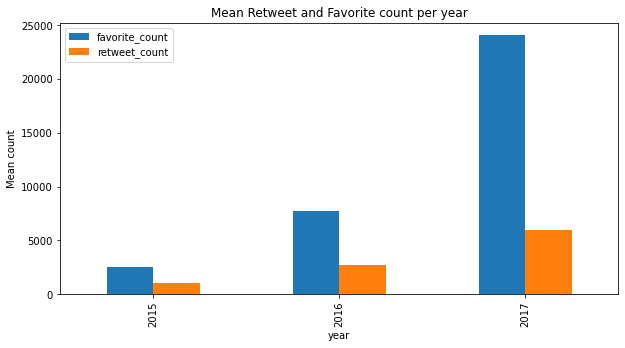

In [72]:
fig, ax = plt.subplots(figsize=(10, 5))
date_plot.plot(kind = 'bar', ax=ax)
plt.title('Mean Retweet and Favorite count per year')
plt.ylabel('Mean count');

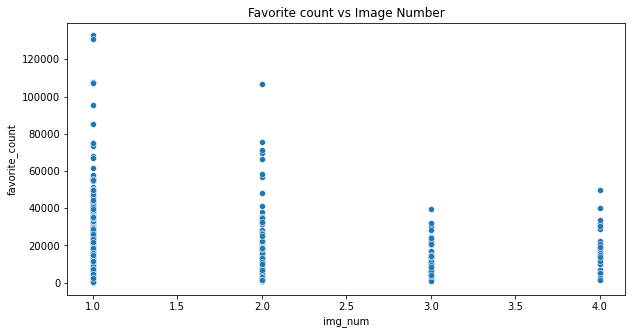

In [73]:
fig, ax = plt.subplots(figsize=(10, 5))
sns.scatterplot(x='img_num', y='favorite_count', data=master_df)
plt.title('Favorite count vs Image Number');

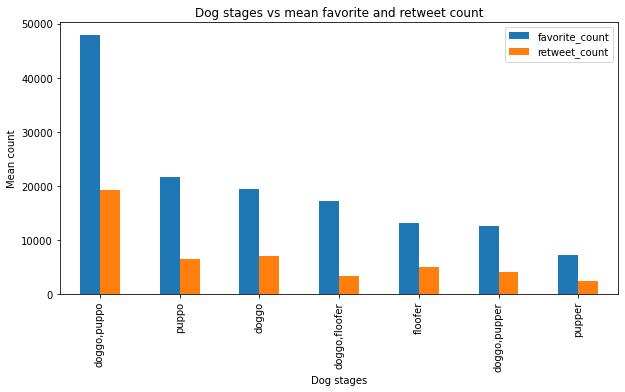

In [74]:
fig, ax = plt.subplots(figsize=(10, 5))
stages.plot(kind = 'bar', ax=ax)
plt.title('Dog stages vs mean favorite and retweet count')
plt.ylabel('Mean count')
plt.xlabel('Dog stages');